# Usar PCA para reordenar archivos de audio

In [1]:
import numpy as np
import scipy.io.wavfile as wf
#import librosa as lr
import matplotlib.pyplot as plt
import IPython.display as display
import sys
sys.path.append('..')
from utils import granular_util as gu
import pandas as pd

Script para hacer análisis y exportar la información en un archivo csv

In [2]:
!../sets/./audio_features_to_csv.py -f ../sets/01_mono.wav --framesize=16384 --hopsize=4096

[   INFO   ] MusicExtractorSVM: no classifier models were configured by default
[   INFO   ] MusicExtractor: Read metadata
[   INFO   ] MusicExtractor: Compute md5 audio hash, codec, length, and EBU 128 loudness
[   INFO   ] MusicExtractor: Replay gain
[   INFO   ] MusicExtractor: Compute audio features
[   INFO   ] ERBBands: input spectrum size (8193) does not correspond to the "inputSize" parameter (1025). Recomputing the filter bank.
[   INFO   ] TriangularBands: input spectrum size (8193) does not correspond to the "inputSize" parameter (1025). Recomputing the filter bank.
[   INFO   ] TriangularBands: input spectrum size (8193) does not correspond to the "inputSize" parameter (1025). Recomputing the filter bank.
[   INFO   ] MusicExtractor: Compute aggregation
[   INFO   ] All done


In [3]:
df = pd.read_csv('./01_mono_frameSize_16384_hopSize_4096.csv')

print(df.shape)
df.head()


(324, 314)


,Unnamed: 0,barkbands_crest,barkbands_flatness_db,barkbands_kurtosis,barkbands_skewness,barkbands_spread,dissonance,erbbands_crest,erbbands_flatness_db,erbbands_kurtosis,...,spectral_contrast_coeffs_2,spectral_contrast_coeffs_3,spectral_contrast_coeffs_4,spectral_contrast_coeffs_5,spectral_contrast_valleys_0,spectral_contrast_valleys_1,spectral_contrast_valleys_2,spectral_contrast_valleys_3,spectral_contrast_valleys_4,spectral_contrast_valleys_5
0,0,6.541465,0.066118,3.273685,-1.831608,25.940798,0.499992,3.075251,0.093815,0.214400,...,-0.964303,-0.962190,-0.960498,-0.960640,-28.207142,-28.229097,-28.149689,-28.281729,-28.303402,-28.333567
1,1,6.593698,0.061712,2.978805,-1.802497,28.626480,0.499996,2.834313,0.088155,-0.046744,...,-0.958171,-0.960699,-0.961042,-0.962272,-28.351423,-28.157913,-28.247080,-28.371935,-28.291885,-28.269213
2,2,6.551431,0.066870,3.211035,-1.847985,26.539387,0.499988,2.971419,0.093173,0.075043,...,-0.962256,-0.964115,-0.959434,-0.962518,-28.374376,-28.275803,-28.297926,-28.199974,-28.351753,-28.254890
3,3,6.260088,0.069798,3.971164,-1.966936,24.828224,0.499998,3.304542,0.096632,0.377444,...,-0.963777,-0.961647,-0.959553,-0.961781,-28.228376,-28.324425,-28.160040,-28.259192,-28.299807,-28.325855
4,4,6.590682,0.063518,3.355011,-1.871956,27.832392,0.499994,2.898743,0.091085,0.200060,...,-0.961255,-0.962742,-0.961631,-0.961178,-28.298748,-28.217333,-28.282715,-28.187492,-28.297901,-28.268087


Voy a armar otro data frame a partir de ciertos features del primero para reducir el tamaño de info y  partir de este, obtener principal components.


In [4]:
from sklearn.preprocessing import StandardScaler
scale = StandardScaler()
#x = df.filter

In [5]:
dfs = []
dfs.append(df.filter(regex='spectral_contrast_coeffs_\d'))
dfs.append(df.filter(regex='mfcc_\d'))
dfs.append(df.filter('spectral_centroid'))
dfs.append(df.filter('pitch_salience'))
dfs.append(df.filter('spectral_energy'))

selectionDf = pd.concat(dfs, axis=1)
#x

In [6]:
selectionDf.head()

,spectral_contrast_coeffs_0,spectral_contrast_coeffs_1,spectral_contrast_coeffs_2,spectral_contrast_coeffs_3,spectral_contrast_coeffs_4,spectral_contrast_coeffs_5,mfcc_0,mfcc_1,mfcc_2,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12
0,-0.964259,-0.964473,-0.964303,-0.962190,-0.960498,-0.960640,-1138.42,0.000011,-0.000061,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038
1,-0.957168,-0.965933,-0.958171,-0.960699,-0.961042,-0.962272,-1138.42,0.000011,-0.000061,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038
2,-0.960105,-0.960351,-0.962256,-0.964115,-0.959434,-0.962518,-1138.42,0.000011,-0.000061,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038
3,-0.961492,-0.964733,-0.963777,-0.961647,-0.959553,-0.961781,-1138.42,0.000011,-0.000061,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038
4,-0.962876,-0.961150,-0.961255,-0.962742,-0.961631,-0.961178,-1138.42,0.000011,-0.000061,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038


#### x va a ser directamente un dataframe con datos estandarizados

In [7]:
x = StandardScaler().fit_transform(selectionDf)

In [8]:
from sklearn.decomposition import PCA

pca = PCA(n_components =2)

principalComponents = pca.fit_transform(x)

principalDf = pd.DataFrame(data = principalComponents,
                          columns = ['principal component 1',
                                    'principal component 2'])

In [14]:
tempDfs = []
tempDfs.append(principalDf)
tempDfs.append(selectionDf)
componentSelectionDf = pd.concat(tempDfs,  axis=1)

In [15]:
componentSelectionDf.head()

,principal component 1,principal component 2,spectral_contrast_coeffs_0,spectral_contrast_coeffs_1,spectral_contrast_coeffs_2,spectral_contrast_coeffs_3,spectral_contrast_coeffs_4,spectral_contrast_coeffs_5,mfcc_0,mfcc_1,...,mfcc_3,mfcc_4,mfcc_5,mfcc_6,mfcc_7,mfcc_8,mfcc_9,mfcc_10,mfcc_11,mfcc_12
0,9.141770,2.831830,-0.964259,-0.964473,-0.964303,-0.962190,-0.960498,-0.960640,-1138.42,0.000011,...,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038
1,9.127390,2.828739,-0.957168,-0.965933,-0.958171,-0.960699,-0.961042,-0.962272,-1138.42,0.000011,...,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038
2,9.133490,2.830590,-0.960105,-0.960351,-0.962256,-0.964115,-0.959434,-0.962518,-1138.42,0.000011,...,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038
3,9.138410,2.832270,-0.961492,-0.964733,-0.963777,-0.961647,-0.959553,-0.961781,-1138.42,0.000011,...,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038
4,9.134411,2.833504,-0.962876,-0.961150,-0.961255,-0.962742,-0.961631,-0.961178,-1138.42,0.000011,...,0.00008,-0.000061,0.000023,-0.000027,-0.000053,-0.000046,-0.000023,-0.000027,-0.000031,-0.000038


In [16]:
import plotly
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

init_notebook_mode(connected=True)

fig = {
    'data': [
        {
            'x': principalDf['principal component 1'],
            'y': principalDf['principal component 2'],
            'text': df['spectral_centroid'],
            'name': str(df['spectral_centroid']),  'mode': 'markers',
        } #for i in range(principalDf['principal component 1'].shape[0])
    ],
    'layout': {
        'xaxis': {'title': 'PCA 1'},
        'yaxis': {'title': "PCA 2"}
    }
}

iplot(fig)

In [17]:
import matplotlib.pyplot as plt

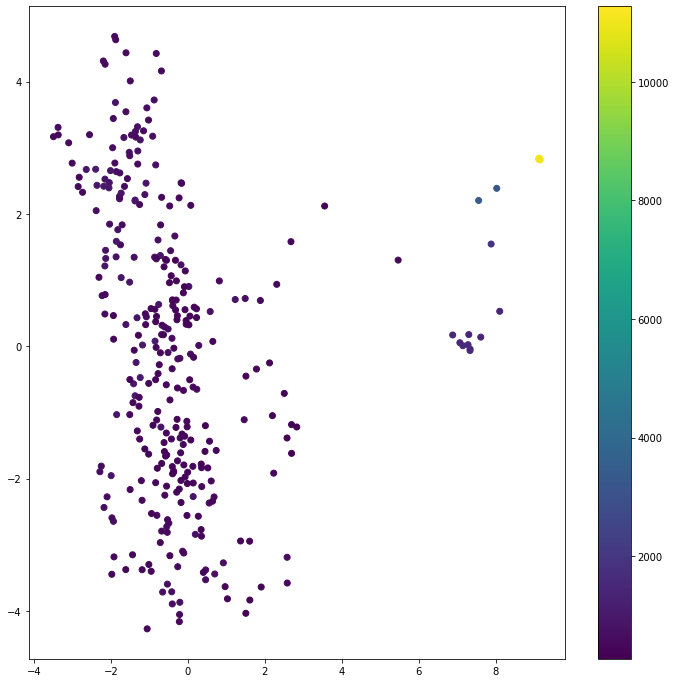

In [18]:
plt.figure(figsize=(12,12))
plt.scatter(principalDf['principal component 1'], principalDf['principal component 2'], c = df["spectral_centroid"] )
plt.colorbar()

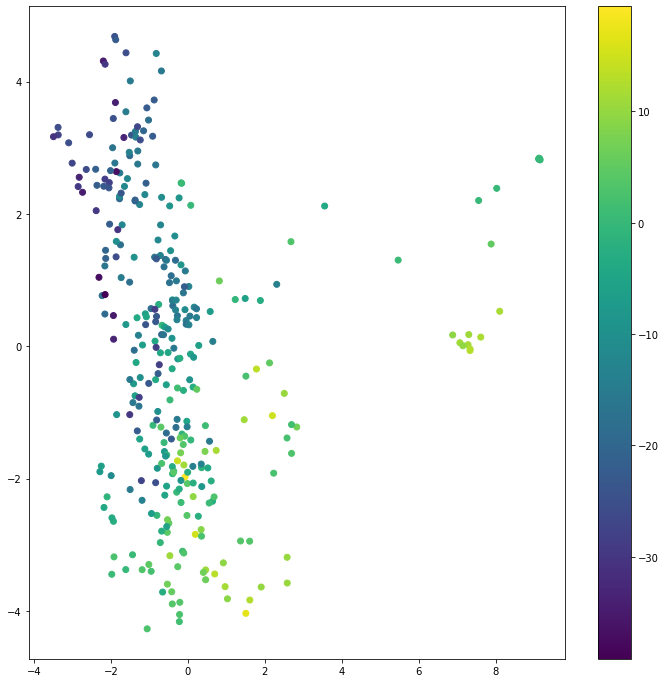

In [19]:
plt.figure(figsize=(12,12))
plt.scatter(principalDf['principal component 1'], principalDf['principal component 2'], c = df["mfcc_5"] )
plt.colorbar()

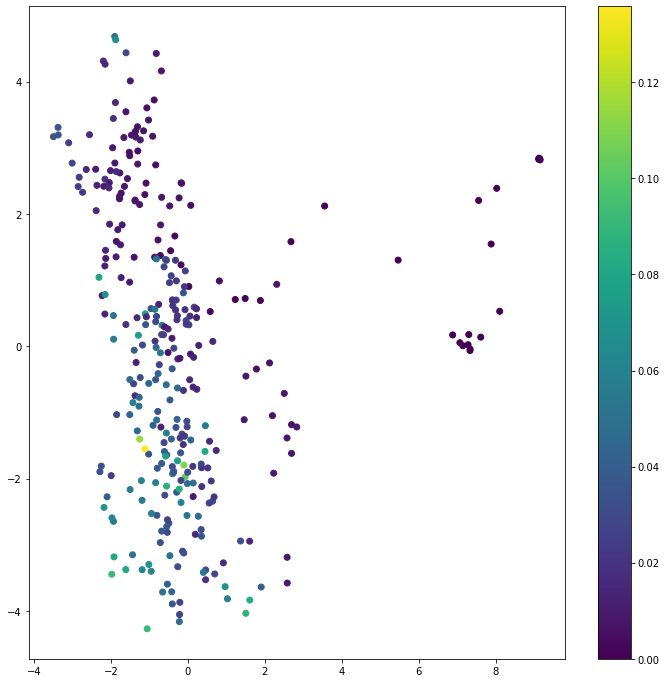

In [20]:
plt.figure(figsize=(12,12))
plt.scatter(principalDf['principal component 1'], principalDf['principal component 2'], c = df["spectral_energy"] )
plt.colorbar()

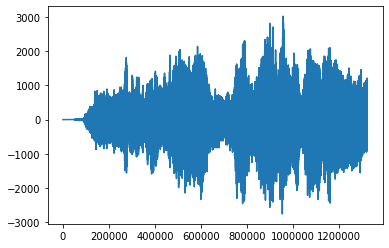

In [21]:
rate, audio_data = wf.read('../sets/01_mono.wav')
plt.plot(audio_data)
display.Audio(audio_data, rate=44100)

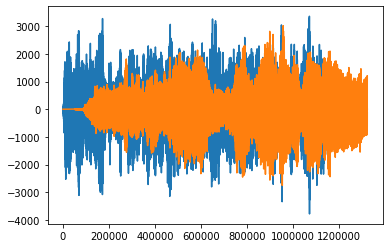

In [22]:
principal_component_1 = np.array(principalDf['principal component 1'].values)
by_pc1_sorted = np.argsort(principal_component_1)
s = gu.rearrenge(16384, 4096, audio_data,by_pc1_sorted, 'hanning')
plt.plot(s)
plt.plot(audio_data)
display.Audio(s, rate=44100)

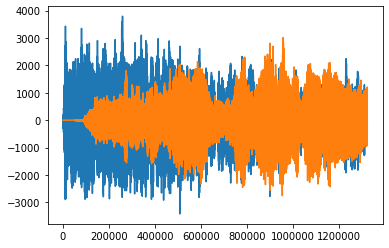

In [23]:
principal_component_2 = np.array(principalDf['principal component 2'].values)
by_pc2_sorted = np.argsort(principal_component_2)
s2 = gu.rearrenge(16384, 4096, audio_data,by_pc2_sorted, 'hanning')
plt.plot(s2)
plt.plot(audio_data)
display.Audio(s2, rate=44100)